# PyTorch Lesson 3: Multilayer Preceptron (MLP)

In [34]:
import torch
from torch import nn
import math

class bcols:
    HEADER = '\033[95m'
    OKBLUE = '\033[94m'
    OKCYAN = '\033[96m'
    OKGREEN = '\033[92m'
    WARNING = '\033[93m'
    FAIL = '\033[91m'
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'

torch.__version__

'1.12.1+cu102'

In [35]:
def print_optim_stats(i, loss):
    print(f"- i = {bcols.OKBLUE}{i}{bcols.ENDC}, loss = {bcols.UNDERLINE}{loss.item():1.2e}{bcols.ENDC}")

# train a model w.r.t. the MSE loss
def train(x, y, model, lr, niter = 100):
    optim = torch.optim.SGD(model.parameters(), lr=lr)

    loss_record = np.zeros(niter)
    n, _ = x.shape
    for i in range(niter):
        optim.zero_grad()               # zeros out model.parameters()'s grads
        loss = sum((y - model(x))**2)/n 
        loss_record[i] = loss.item()    # record the loss
        loss.backward()                 # updates model.parameters()'s grads
        optim.step()                    # updates model.parameters()
        if i % round(niter / 5) == 0: 
            print_optim_stats(i, loss)            

    print_optim_stats(i, loss)
    return loss_record

# print model parameters or their shapes
def print_params(model, shape = False):
    for param in model.parameters():
        if shape:
            print(param.shape)
        else:
            print(param)

## Defining a dense layer

In [36]:
class Dense(nn.Module):
    def __init__(self, in_dim, out_dim = None, W = None, b = None):
        super().__init__()

        if out_dim is None:
            out_dim = 1

        self.layer = nn.Sequential(
            nn.Linear(in_features = in_dim, out_features = out_dim),
            nn.ReLU()
        )

        if W is not None:
            # self.layer[0].weight.data = W
            self.layer[0].weight = nn.Parameter(W)

        if b is not None:
            self.layer[0].bias = nn.Parameter(b)

    def forward(self,x):
        return self.layer(x)


model = Dense(2,4)
print(model)
print_params(model)

Dense(
  (layer): Sequential(
    (0): Linear(in_features=2, out_features=4, bias=True)
    (1): ReLU()
  )
)
Parameter containing:
tensor([[-0.0548, -0.2598],
        [ 0.4031,  0.1722],
        [ 0.5572,  0.3492],
        [ 0.2234, -0.1784]], requires_grad=True)
Parameter containing:
tensor([ 0.3636, -0.2171, -0.0403,  0.6520], requires_grad=True)


In [37]:
type(model.layer[0].weight)

torch.nn.parameter.Parameter

In [38]:
W = torch.tensor([[1.,1],[-1,-1],[-1,1],[1,-1]])
b = torch.tensor([-1.,-1,-1,-1])
hlayer = Dense(2,4,W,b)
print_params(hlayer)

Parameter containing:
tensor([[ 1.,  1.],
        [-1., -1.],
        [-1.,  1.],
        [ 1., -1.]], requires_grad=True)
Parameter containing:
tensor([-1., -1., -1., -1.], requires_grad=True)


In [39]:
hlayer(torch.tensor([-1.,1]))

tensor([0., 0., 1., 0.], grad_fn=<ReluBackward0>)

In [40]:
olayer = Dense(4, 1 , torch.ones(1,4), torch.tensor([0.])) 
print_params(olayer, True)

torch.Size([1, 4])
torch.Size([1])


In [41]:
model = nn.Sequential(hlayer, olayer)
x = torch.randn(10,2)
model(x)

tensor([[0.0000],
        [0.0000],
        [0.9025],
        [0.6895],
        [0.0000],
        [0.0000],
        [0.0449],
        [2.4060],
        [0.2041],
        [0.0000]], grad_fn=<ReluBackward0>)

In [42]:
import numpy as np
import plotly.graph_objects as go

def plot_surf(model, range=[-1,1], npoints = 100, contours = False):
    x = y = np.linspace(*range, npoints)
    X, Y = np.meshgrid(x, y)
    xin = torch.tensor(np.array([np.ravel(X), np.ravel(Y)]), dtype=torch.float).t()
    zout = model(xin).detach().numpy().ravel()   

    Z = zout.reshape(X.shape)
    fig = go.Figure(data=[go.Surface(x=X, y=Y, z=Z)])
    if contours:
        fig.update_traces(contours_z=dict(
            show=True, usecolormap=True, highlightcolor="limegreen", project_z=True
            ))
    
    fig.update_layout(autosize=False, width=600, height=500,
                  margin=dict(l=65, r=50, b=65, t=65))
    fig.show()

plot_surf(model, [-3,3], 100, True)

## Approximating a quadratic function

In [43]:
class Quad(nn.Module):
    def forward(self, x):
        return torch.sum(x**2, dim=1)[:,None]
quad = Quad()
plot_surf(quad, [-1,1])

In [44]:
seed = np.random.randint(10**5)
print(hex(seed))
torch.manual_seed(seed)

model = nn.Sequential(Dense(2,4), nn.Linear(4,1))
plot_surf(model, [-2,2])

0x19b5


In [45]:
x = torch.randn(100,2)
y = quad(x)  # true function

- i = 0, loss = 9.75e+00
- i = 200, loss = 2.34e-01
- i = 400, loss = 2.23e-01
- i = 600, loss = 2.23e-01
- i = 800, loss = 2.23e-01
- i = 999, loss = 2.23e-01


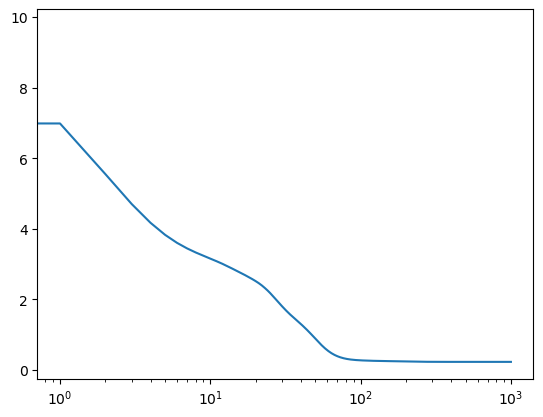

In [46]:
import matplotlib.pyplot as plt

loss_rec = train(x, y, model, 0.1, 1000)
plt.semilogx(loss_rec);

In [47]:
plot_surf(model,[-2,2])

In [48]:
torch.manual_seed(0x1867b)
model1 = nn.Sequential(Dense(2,4), nn.Linear(4,1))
model2 = nn.Sequential(Dense(2,4), Dense(4,4), nn.Linear(4,1))

In [49]:
plot_surf(model2)

In [50]:
niter = 1000
loss_rec1 = train(x, y, model1, 0.1, niter)
print("\n")
loss_rec2= train(x, y, model2, 0.1, niter)

- i = 0, loss = 8.06e+00
- i = 200, loss = 1.49e-01
- i = 400, loss = 1.36e-01
- i = 600, loss = 1.30e-01
- i = 800, loss = 1.28e-01
- i = 999, loss = 1.19e-01


- i = 0, loss = 9.64e+00
- i = 200, loss = 1.43e+00
- i = 400, loss = 1.44e+00
- i = 600, loss = 1.47e+00
- i = 800, loss = 1.44e+00
- i = 999, loss = 1.35e+00


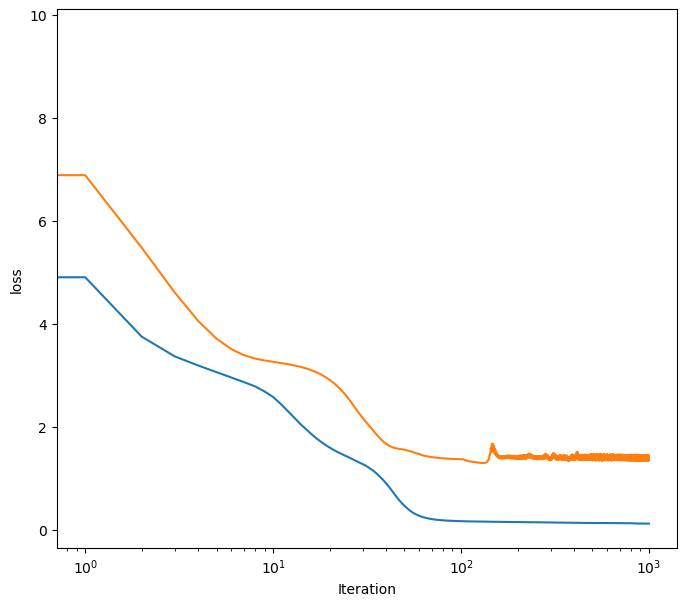

In [51]:
fig = plt.figure(figsize=(8,7))
plt.semilogx(loss_rec1);
plt.semilogx(loss_rec2);
plt.xlabel("Iteration")
plt.ylabel("loss")
# fig.tight_layout()
fig.savefig("loss_iter.png")

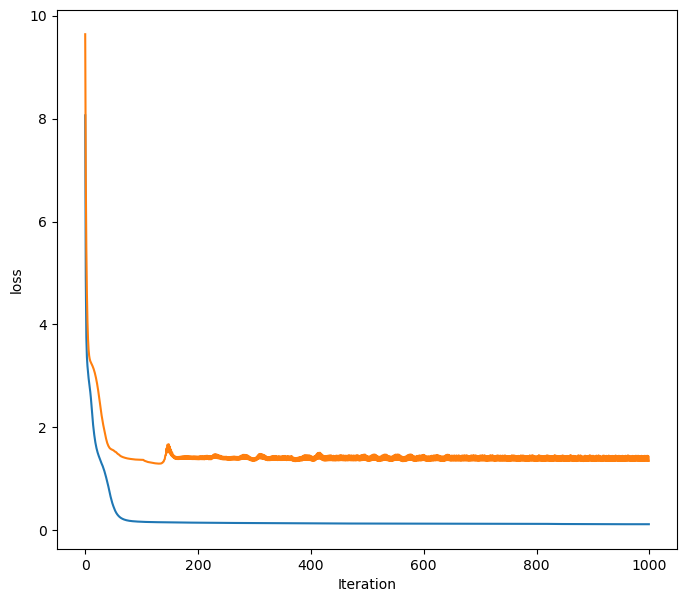

In [52]:
fig = plt.figure(figsize=(8,7))
plt.plot(loss_rec1);
plt.plot(loss_rec2);
plt.xlabel("Iteration")
plt.ylabel("loss")
fig.savefig("loss_iter2.png")

In [53]:
plot_surf(model2, range=[-2,2])

In [54]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_surf(*models, range=[-1,1], npoints = 100, contours = False):
    x = y = np.linspace(*range, npoints)
    X, Y = np.meshgrid(x, y)
    xin = torch.tensor(np.array([np.ravel(X), np.ravel(Y)]), dtype=torch.float).t()
    
    n_models = len(models)
    fig = make_subplots(rows=1, cols=n_models, specs = [[{'type': 'surface'}]*n_models])

    for j, model in enumerate(models):
      zout = model(xin).detach().numpy().ravel()   
      Z = zout.reshape(X.shape)
      fig.add_trace(
          go.Surface(x=X, y=Y, z=Z),
          row=1, col=j+1
      )
    if contours:
        fig.update_traces(contours_z=dict(
            show=True, usecolormap=True, highlightcolor="limegreen", project_z=True
            ))
    
    fig.update_layout(autosize=False, width=400*n_models, height=500,
                  margin=dict(l=65, r=50, b=65, t=65))
    fig.show()

In [55]:
seed = 0xdd7d
print(hex(seed))
torch.manual_seed(seed)

h = 10
model1 = nn.Sequential(Dense(2,h), nn.Linear(h,1))
model2 = nn.Sequential(Dense(2,h), Dense(h,h), nn.Linear(h,1))
model3 = nn.Sequential(Dense(2,h), Dense(h,h), Dense(h,h), Dense(h,h), Dense(h,h), nn.Linear(h,1))

plot_surf(model1, model2, model3, range = [-2,2])

0xdd7d


- i = 0, loss = 7.09e+00
- i = 200, loss = 1.59e+00
- i = 400, loss = 9.49e-01
- i = 600, loss = 5.59e-01
- i = 800, loss = 3.52e-01
- i = 999, loss = 2.62e-01


- i = 0, loss = 7.27e+00
- i = 200, loss = 1.19e+00
- i = 400, loss = 2.80e-01
- i = 600, loss = 1.41e-01
- i = 800, loss = 9.82e-02
- i = 999, loss = 7.03e-02


- i = 0, loss = 7.73e+00
- i = 200, loss = 3.25e+00
- i = 400, loss = 2.32e+00
- i = 600, loss = 1.42e-01
- i = 800, loss = 5.60e-02
- i = 999, loss = 4.26e-02


Text(0, 0.5, 'loss')

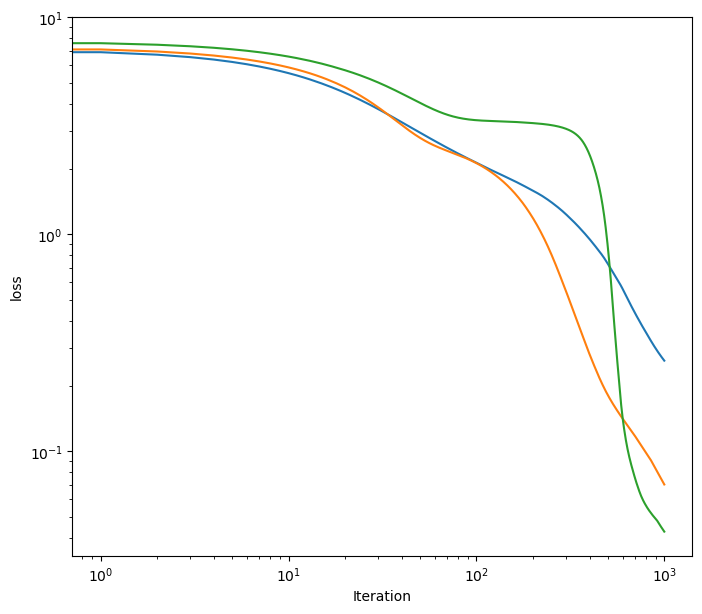

In [56]:
lr = .005
niter = 1000
loss_rec1 = train(x, y, model1, lr, niter)
print("\n")
loss_rec2= train(x, y, model2, lr, niter)
print("\n")
loss_rec3= train(x, y, model3, lr, niter)


fig = plt.figure(figsize=(8,7))
plt.loglog(loss_rec1);
plt.loglog(loss_rec2);
plt.loglog(loss_rec3);
plt.xlabel("Iteration")
plt.ylabel("loss")
# fig.tight_layout()

In [57]:
plot_surf(model1, model2, model3, range = [-2,2])